1. The reasoning provided by ChatGPT in the answer appears valid, given all the assumptions it states - however it's important to acknowledge how large a role the assumptions have played in the answer. It takes a frequentist approach which assumes no prior information about the probability of the coin landing on heads or tails, it uses a normal distribution to model the sampling distribution (which generally assumes a large number of samples), and takes a relatively arbitrary confidence interval of 0.05 to then produce the percentage chance.  

2. a) Take a sample of a 100 people - 0.98 are TP, 0.2 are FN, 97.02 are TN and 1.98 are FP. Therefore chances of a TP among positive results is $0.98/2.86$ or $33.1$%. The same result can be calculated via bayes theorem. 

   b) Given the larger sample collection of Carlos, the standard error of the mean is likely to be 10x smaller than Amelia, as the standard error is the standard deviation divided by the number of samples.

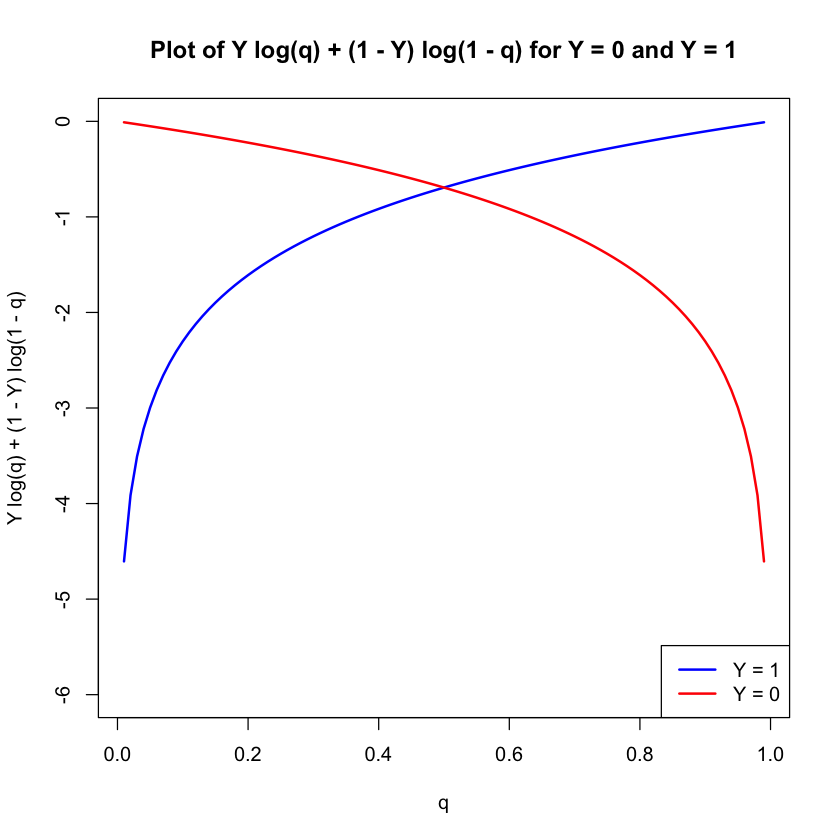

In [36]:
# 3. b)
# Define the range for q (from slightly above 0 to slightly below 1)
q <- seq(0.01, 0.99, by = 0.01)

# Define the functions for Y = 0 and Y = 1
f_Y1 <- log(q)         # Y = 1 -> function becomes log(q)
f_Y0 <- log(1 - q)     # Y = 0 -> function becomes log(1 - q)

# Plot for Y = 1
plot(q, f_Y1, type = "l", col = "blue", lwd = 2, ylim = c(-6, 0),
     ylab = "Y log(q) + (1 - Y) log(1 - q)", xlab = "q",
     main = "Plot of Y log(q) + (1 - Y) log(1 - q) for Y = 0 and Y = 1")
lines(q, f_Y0, col = "red", lwd = 2) # Add line for Y = 0

# Add a legend
legend("bottomright", legend = c("Y = 1", "Y = 0"), col = c("blue", "red"), lwd = 2)


As we can see here, predictions with q closer to 1, when Y=1, results in a smaller loss, and q closer to 0 when Y=0 also has a small loss - but if Y=1, and q is closer to 0, there is a large loss, and it exponentially adds loss for predictions further away from the true ('confident' incorrect predictions)

3. c)
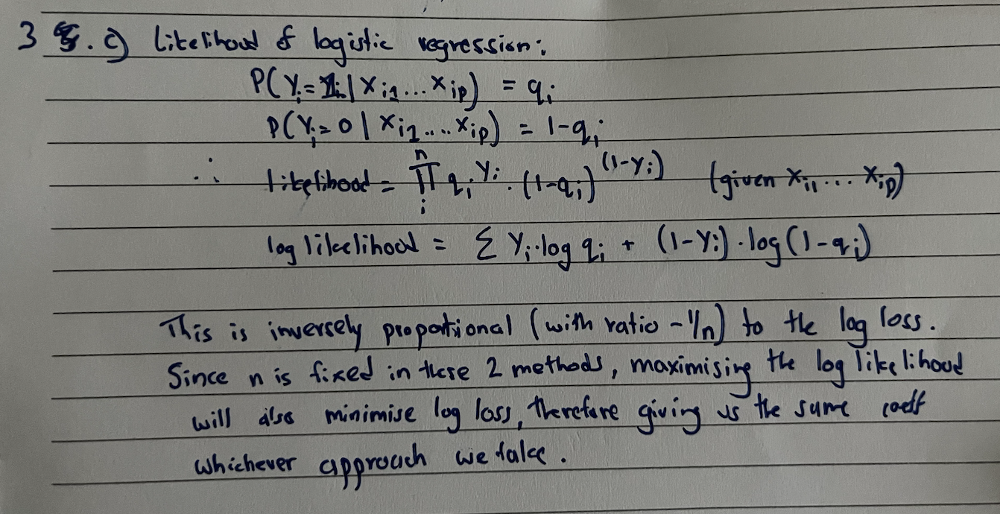

3. d)
Logistic regression still produces a linear model, if we want to model non-linear relationships we might still use other modelling strategies other than logistic regression.

3. e)
If B is fixed and A is larger, the classifier is likely to produce better results for Y=1 (predict positive outcomes more accurately), as the loss for a poor prediction on Y=1 data points results in a larger loss. Vice versa when A is fixed and B is larger.


In [20]:
# 4. a)

library(dplyr)
library(readr)

spam_train <- read_csv("spam_train.csv")
spam_test <- read_csv("spam_test.csv")

# Function to calculate Gini impurity
calculate_gini <- function(q) {
  return(1 - q^2 - (1 - q)^2)
}

# Function to calculate weighted Gini impurity for a given covariate
calculate_weighted_gini <- function(data, covariate) {
  # Split data based on median value of the covariate
  threshold <- median(data[[covariate]])
  subset1 <- data %>% filter(get(covariate) <= threshold)
  subset2 <- data %>% filter(get(covariate) > threshold)
  
  # Calculate q for each subset
  q1 <- mean(subset1$spam)
  q2 <- mean(subset2$spam)
  
  # Calculate Gini impurity for each subset
  gini1 <- calculate_gini(q1)
  gini2 <- calculate_gini(q2)
  
  # Calculate weighted Gini impurity
  weight1 <- nrow(subset1) / nrow(data)
  weight2 <- nrow(subset2) / nrow(data)
  
  weighted_gini <- weight1 * gini1 + weight2 * gini2
  return(weighted_gini)
}

# Step 2: Calculate weighted Gini impurity for each covariate
covariates <- names(spam_train)[1:48]  # Assuming the first 48 columns are covariates
gini_scores <- sapply(covariates, function(covariate) {
  calculate_weighted_gini(spam_train, covariate)
})

# Step 3: Sort and report the covariates with the lowest five Gini impurity scores
gini_df <- data.frame(Covariate = covariates, WeightedGini = gini_scores)
top_5 <- gini_df %>% arrange(WeightedGini) %>% head(5)

# Display the top 5 covariates with the lowest Gini impurity scores
print(top_5)


Rows: 2300 Columns: 49
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl (49): make, address, all, X3d, our, over, remove, internet, order, mail,...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 2300 Columns: 49
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl (49): make, address, all, X3d, our, over, remove, internet, order, mail,...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


       Covariate WeightedGini
remove    remove    0.3535761
free        free    0.3684388
money      money    0.3698487
X000        X000    0.4069082
hp            hp    0.4077478


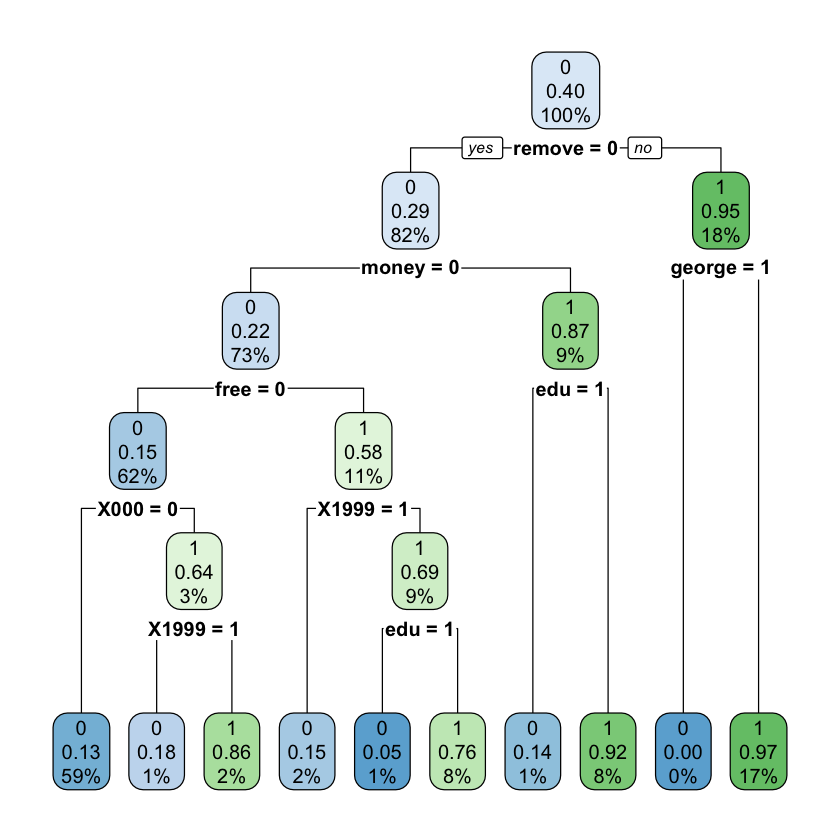

In [21]:
#  4. b) 

library(rpart)
library(rpart.plot)

fm = rpart(spam ~., data = spam_train, method = "class", parms=list(split="gini"))
rpart.plot(fm)

4. c)
On a message without any of the words, we would make a prediction of not spam (0), and on a prediction with all the keywrods, we would make a prediction of spam (1). 

In [25]:
# 4. d) 
accuracy_results <- numeric(5)

# Loop over maxdepth values from 1 to 5
for (depth in 1:5) {
  
  # Train the decision tree with maxdepth set to the current depth value
  fm <- rpart(spam ~ ., data = spam_train, method = "class", parms = list(split = "gini"), control = rpart.control(maxdepth = depth))
  
  # Make predictions on the test data
  predictions <- predict(fm, spam_test, type = "class")
  
  # Calculate accuracy
  correct_predictions <- sum(predictions == spam_test$spam)
  accuracy <- correct_predictions / nrow(spam_test)
  
  # Store the accuracy in the results vector
  accuracy_results[depth] <- accuracy
}

# Display the accuracy results for each depth
accuracy_results <- data.frame(maxdepth = 1:5, Accuracy = accuracy_results)
View(accuracy_results)

maxdepth,Accuracy
<int>,<dbl>
1,0.7556522
2,0.8239130
3,0.8473913
4,0.8708696
5,0.8843478


As we can see, the accuracy increases as we go increase the number of levels in the tree, with more paths captured

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "AUC: 0.884815100281198"


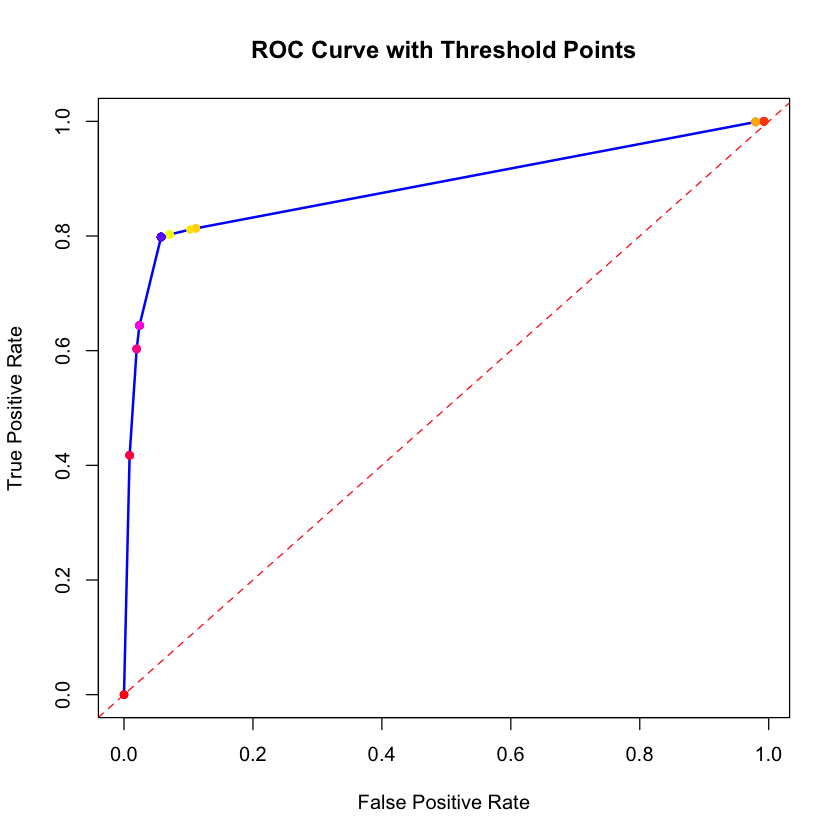

In [33]:
# 4. e) 
library(pROC)
fm <- rpart(spam ~ ., data = spam_train, method = "class", parms = list(split = "gini"), control = rpart.control(maxdepth = 5))

# Predict probabilities on the test data
prob_predictions <- predict(fm, spam_test, type = "prob")[, 2]  # Probability for class 1

# Actual labels for the test set
true_labels <- spam_test$spam

# Define thresholds from 0 to 1 in steps of 0.05
thresholds <- seq(0, 1, by = 0.01)

# Initialize vectors to store true positive rate (TPR) and false positive rate (FPR)
tpr <- numeric(length(thresholds))
fpr <- numeric(length(thresholds))

# Calculate TPR and FPR for each threshold
for (i in seq_along(thresholds)) {
  threshold <- thresholds[i]
  
  # Classify as 1 if probability > threshold, otherwise 0
  predicted_labels <- ifelse(prob_predictions > threshold, 1, 0)
  
  # Calculate true positives, false positives, true negatives, and false negatives
  tp <- sum(predicted_labels == 1 & true_labels == 1)
  fp <- sum(predicted_labels == 1 & true_labels == 0)
  tn <- sum(predicted_labels == 0 & true_labels == 0)
  fn <- sum(predicted_labels == 0 & true_labels == 1)
  
  # Calculate TPR and FPR
  tpr[i] <- tp / (tp + fn)  # True Positive Rate (Sensitivity)
  fpr[i] <- fp / (fp + tn)  # False Positive Rate (1 - Specificity)
}

# Plot the main ROC curve
plot(fpr, tpr, type = "l", col = "blue", lwd = 2, xlab = "False Positive Rate", ylab = "True Positive Rate",
     main = "ROC Curve with Threshold Points")

# Add a diagonal line for reference
abline(a = 0, b = 1, col = "red", lty = 2)

# Add points to indicate each threshold along the ROC curve
points(fpr, tpr, col = rainbow(length(thresholds)), pch = 19, cex = 0.8)

# Optional: calculate AUC using pROC package
roc_curve <- roc(true_labels, prob_predictions)
auc_value <- auc(roc_curve)
print(paste("AUC:", auc_value))

I'd pick the point on the curve around the 0.63 TP rate (pink dot) with a low <0.05 FP rate, as it's better to have 30-40% of spam undetected, rather than have a high false positive rate and actually filter out important emails.

5.a) 
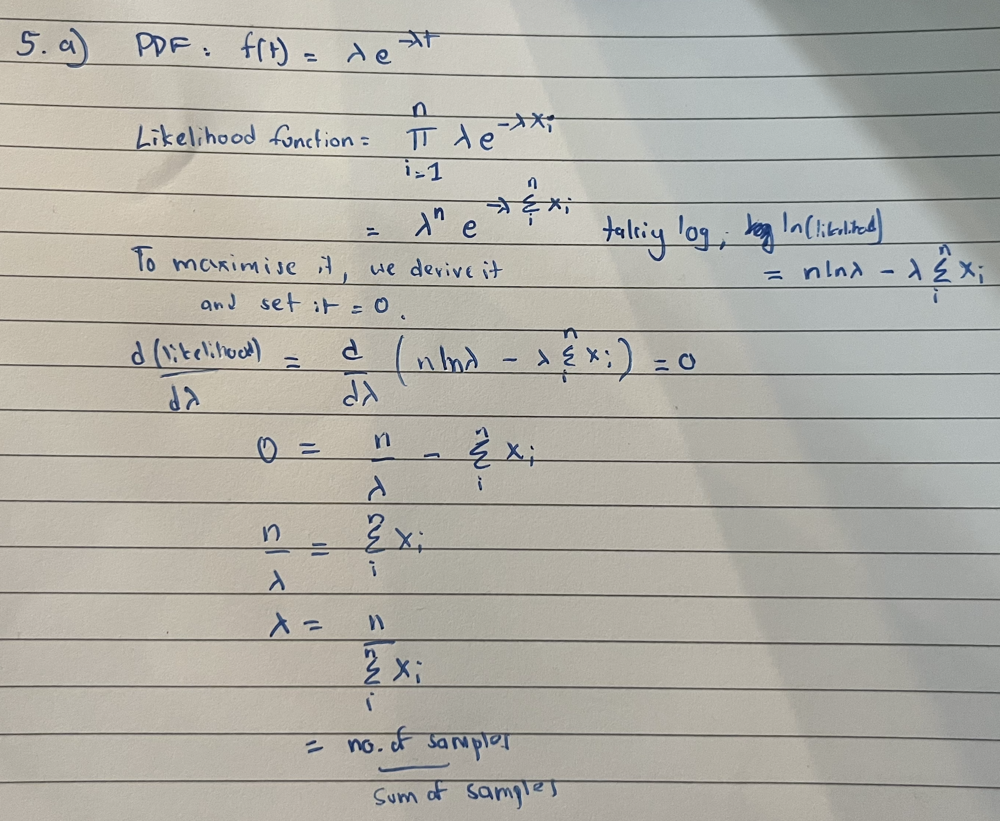

5. b)
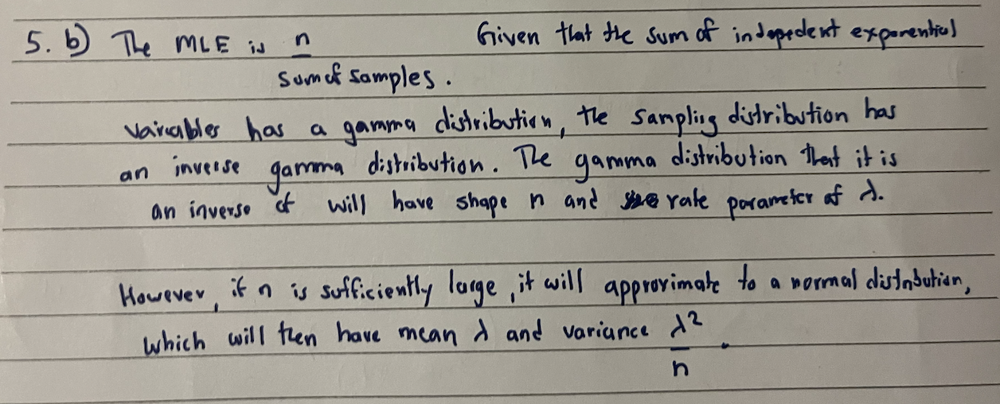

5. c)
 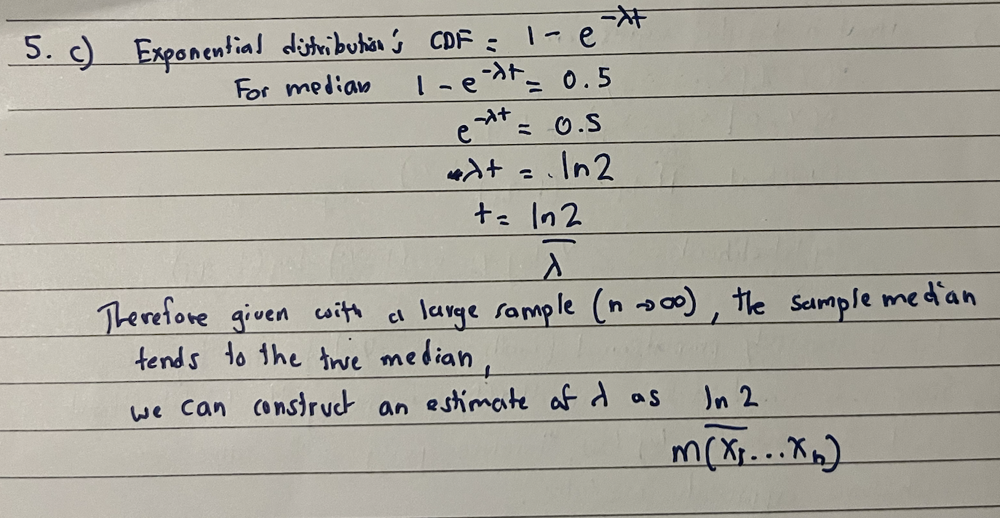

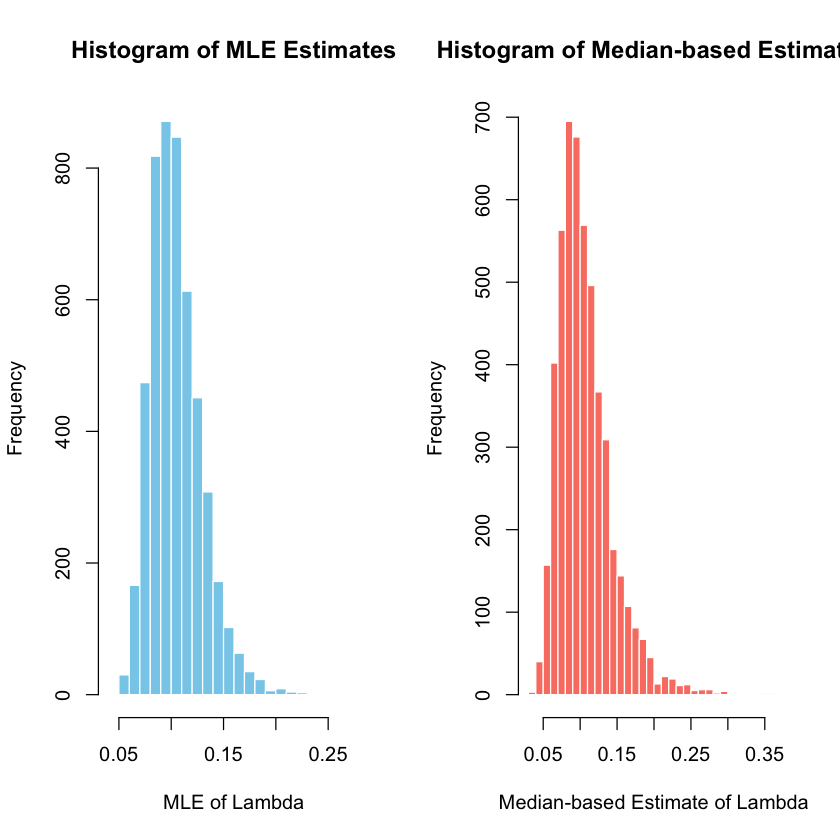

In [8]:
# 5. d)
# Set parameters for the simulation
set.seed(1)  # For reproducibility
n <- 20        # Sample size
lambda <- 0.1  # True lambda
simulations <- 5000  # Number of simulations

# Initialize vectors to store the estimators
mle_estimates <- numeric(simulations)
median_estimates <- numeric(simulations)

# Run the simulation
for (i in 1:simulations) {
  # Generate n samples from an exponential distribution with rate = lambda
  samples <- rexp(n, rate = lambda)
  
  # Calculate the MLE (1 / mean of samples)
  mle_estimates[i] <- 1 / mean(samples)
  
  # Calculate the sample median and use it to estimate lambda
  sample_median <- median(samples)
  median_estimates[i] <- log(2) / sample_median  # Since median of exponential is log(2) / lambda
}

# Plot histograms for both estimators
par(mfrow = c(1, 2))  # Set up a 1x2 plotting layout

# Histogram of MLE estimates
hist(mle_estimates, breaks = 30, main = "Histogram of MLE Estimates",
     xlab = "MLE of Lambda", col = "skyblue", border = "white")

# Histogram of Median-based estimates
hist(median_estimates, breaks = 30, main = "Histogram of Median-based Estimates",
     xlab = "Median-based Estimate of Lambda", col = "salmon", border = "white")

par(mfrow = c(1, 1))  # Reset to default layout


**6. a)**


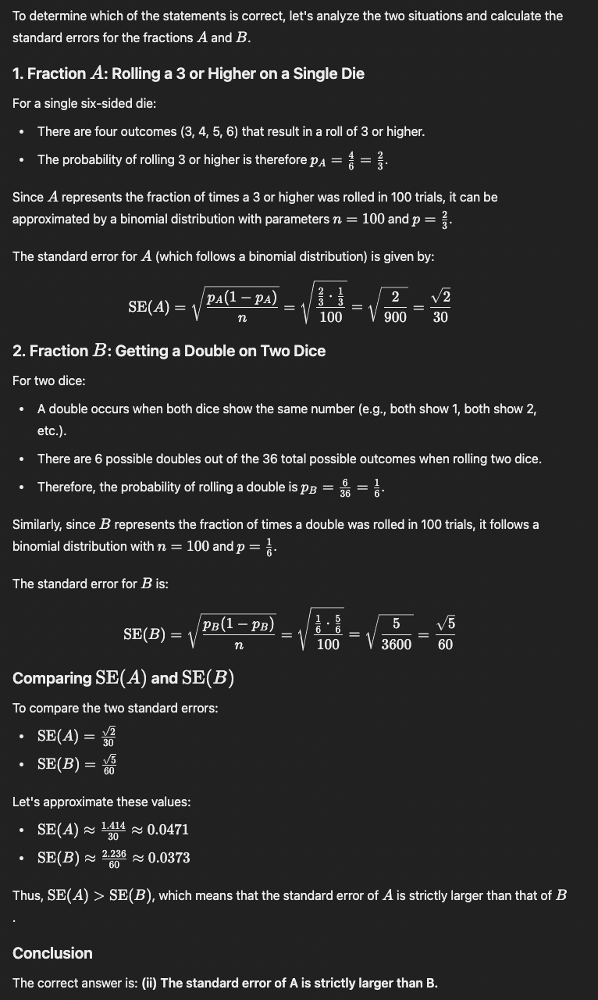

**6. b)**

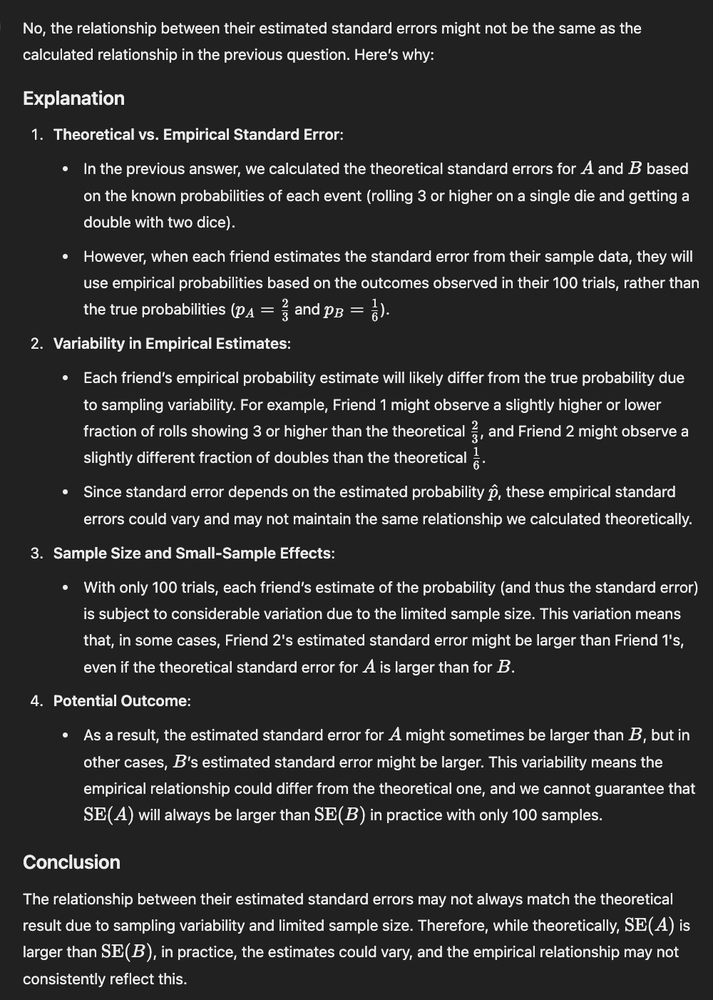

None of the reasonings given in the statement are particularly incorrect, it is true that small sample effects and variability may lead to different observed standard errors, however there is still a strong assumption that this is a fair six-sided die which is not mentioned by the LLM (the question only says standard). 